# Исследование рынка заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве.

Для анализа доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

Цель исследования - найти закономерности и интересные особенности, которые помогут инвесторам в выборе подходящего места для открытия кофейни «Central Perk» из культового сериала «Friends».

## 1. Описание данных

Файл ```moscow_places.csv```:

- ```name``` — название заведения

- ```address``` — адрес заведения

- ```category``` — категория заведения, например «кафе», «пиццерия» или «кофейня»

- ```hours``` — информация о днях и часах работы

- ```lat``` — широта географической точки, в которой находится заведение

- ```lng``` — долгота географической точки, в которой находится заведение

- ```rating``` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0)

- ```price``` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее

- ```avg_bill``` — строка, которая хранит среднюю стоимость заказа в виде диапазона

- ```middle_avg_bill``` — число с оценкой среднего чека, которое указано только для значений из столбца ```avg_bill```

- ```middle_coffee_cup``` — число с оценкой одной чашки капучино, которое указано только для значений из столбца                                      ```avg_bill```, начинающихся с подстроки «Цена одной чашки капучино»

- ```chain``` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым:
              0 — заведение не является сетевым
              1 — заведение является сетевым
              
- ```district``` — административный район, в котором находится заведение, например Центральный административный округ

- ```seats``` — количество посадочных мест.

## 2. Загрузка данных

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import json
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
pio.renderers.default = "browser"
from plotly.subplots import make_subplots
import folium

In [2]:
pd.set_option('display.max_rows', None)

In [3]:
pd.options.display.float_format = '{: .2f}'.format

In [4]:
data = pd.read_csv(r"C:\Users\N\OneDrive\Desktop\study\ipynb\my projects\project_7_central_perk\moscow_places.csv")

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [6]:
data.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00


В датасете информация о **8406** заведениях Москвы.

## 3. Предобработка и предварительный анализ данных

### 3.1. Дубликаты

In [7]:
# смотрим дубликаты

data.duplicated().sum()

0

Явных дубликатов нет.

In [8]:
# смотрим неявные дубликаты по паре название-адрес

data_name_add = data[['name','address']]
data_name_add.duplicated().sum()

0

Похоже, дубликатов в датасете нет.

### 3.2. Статистика по всему датасету

In [9]:
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.00,8406.00,8406.00,3149.00,535.00,8406.00,4795.00
mean,55.75,37.61,4.23,958.05,174.72,0.38,108.42
std,0.07,0.10,0.47,1009.73,88.95,0.49,122.83
min,55.57,37.36,1.00,0.00,60.00,0.00,0.00
25%,55.71,37.54,4.10,375.00,124.50,0.00,40.00
50%,55.75,37.61,4.30,750.00,169.00,0.00,75.00
75%,55.80,37.66,4.40,1250.00,225.00,1.00,140.00
max,55.93,37.87,5.00,35000.00,1568.00,1.00,1288.00


Здесь мы видим, что стоит обратить внимание на:
- максимальное число посадочных мест: 1288;
- минимальное число посадочных мест: 0;
- есть средний чек равный 0, а также аномально большой чек - 35000;
- есть средняя чашка кофе стоимостью 1568 рублей.

Разберемся с этими аномалиями и выбросами ниже.

### 3.3. Столбец ```name```

In [10]:
# оценим пропуски в столбце с названием

data['name'].isna().sum()

0

In [11]:
# посчитаем количество уникальных названий

data['name'].nunique()

5614

В датасете 5614 уникальных названий заведений. Также в датасете есть сететвые заведения.

### 3.4. Столбец ```category```

In [12]:
# оценим пропуски в столбце с категорией

data['category'].isna().sum()

0

In [13]:
# смотрим, какие категории заведений представлены

data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

### 3.5. Столбец ```address```

In [14]:
# оценим пропуски в столбце с адресом

data['address'].isna().sum()

0

In [15]:
# оставляем от адреса только улицу

data['street'] = [x.split(', ')[1] for x in data['address']]

#check

data['street'].head(3)

0         улица Дыбенко
1         улица Дыбенко
2    Клязьминская улица
Name: street, dtype: object

In [16]:
# сколько уникальных улиц в датасете

data['street'].nunique()

1448

### 3.6. Столбец ```district```

In [17]:
# оценим пропуски в столбце с районами

data['district'].isna().sum()

0

In [18]:
# смотрим, какие АО Москвы вошли в датасет

data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [19]:
# избавляемся от длинных названий районов

data['AO'] = data['district'].str.replace('-','')

# словарь для замены
districts_dict = {'Северный административный округ':'САО',
                    'СевероВосточный административный округ':'СВАО',
                    'СевероЗападный административный округ':'СЗАО',
                    'Западный административный округ':'ЗАО',
                    'Центральный административный округ':'ЦАО',
                     'Восточный административный округ':'ВАО',
                     'ЮгоВосточный административный округ':'ЮВАО',
                     'Южный административный округ':'ЮАО',
                     'ЮгоЗападный административный округ':'ЮЗАО'}

In [20]:
# замена

for i, j in districts_dict.items(): 
    data['AO'] = data['AO'].replace(i,j)

In [21]:
# check

data['AO'].unique()

array(['САО', 'СВАО', 'СЗАО', 'ЗАО', 'ЦАО', 'ВАО', 'ЮВАО', 'ЮАО', 'ЮЗАО'],
      dtype=object)

*В исследовании не участвуют Зеленоградский, Троицкий и Новомосковский округи.*

### 3.7. Столбец ```hours```

In [22]:
# оценим пропуски в столбце с режимом работы

data['hours'].isna().sum()

536

In [23]:
# пропуски в часах работы заменим заглушкой "неизвестно"

data['hours'] = data['hours'].fillna('неизвестно')

#check
data['hours'].isna().sum()

0

In [24]:
# функция для нахождения заведений, работающих круглосуточно и без выходных (далее - "круглосуточно")

def around_the_clock(row):
    if 'ежедневно, круглосуточно' in row:
        return True
    elif 'неизвестно' in row:
        return 'unknown'
    else:
        return False

In [25]:
# выделим отдельно круглосуточные заведения

data['around_the_clock'] = data['hours'].apply(around_the_clock)
data.groupby('around_the_clock').agg({'name':'count'})

,name
around_the_clock,
False,7140
True,730
unknown,536


### 3.8. Столбец ```rating```

In [26]:
# оценим пропуски в столбце с рейтингом

data['rating'].isna().sum()

0

In [27]:
# смотрим, по какой шкале оценивается рейтинг

print('Рейтинг оценивается в пределах от',
      data['rating'].min(),
      'до',
      data['rating'].max())

Рейтинг оценивается в пределах от 1.0 до 5.0


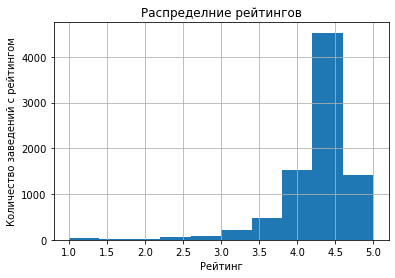

In [28]:
# смотрим распределение рейтингов по всей выборке

data['rating'].hist()
plt.title('Распределние рейтингов')
plt.xlabel('Рейтинг')
plt.ylabel('Количество заведений с рейтингом');

Выброcов и аномалий не обнаружено. Распределение нормальное.

### 3.9. Столбец ```price```

In [29]:
# оценим пропуски в столбце с ценовой категорией

data['price'].isna().sum()

5091

Около 60 % данных в данном столбце пропущено.

In [30]:
# смотрим, какие используются ценовые категории

data['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [31]:
# поставим заглушку в ячейках с отсутствующими данными

data['price'] = data['price'].fillna('неизвестно')

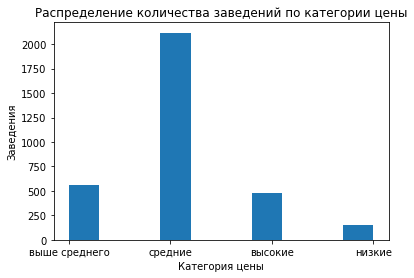

In [32]:
# посмотрим распределение заведений по категориям цены

data.query('price != "неизвестно"')['price'].hist()
plt.title('Распределение количества заведений по категории цены')
plt.xlabel('Категория цены')
plt.ylabel('Заведения')
plt.grid(False);

Заведенией в "средней" ценовой категории больше, чем всех остальных. Однако, эти данные доступны не для всего датасета.

### 3.10. Столбец ```avg_bill```

In [33]:
# оценим пропуски в столбце со средним чеком

data['avg_bill'].isna().sum()

4590

Оставим их в виде пропусков.

### 3.11. Столбец ```middle_avg_bill```

In [34]:
# оценим пропуски в столбце со средним чеком

data['middle_avg_bill'].isna().sum()

5257

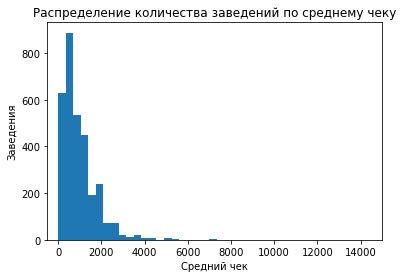

In [35]:
# посмотрим распределение заведений по среднему чеку

ax = data['middle_avg_bill'].hist(bins=100)
ax.set_xlim(-500, 15000)
plt.title('Распределение количества заведений по среднему чеку')
plt.xlabel('Средний чек')
plt.ylabel('Заведения')
plt.grid(False);

Распределение нормальное.

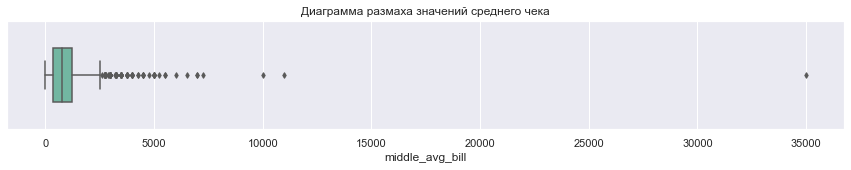

In [36]:
# посмторим выбросы для среднего чека 

sns.set(rc={'figure.figsize':(15,2)})
ax = sns.boxplot(x='middle_avg_bill', y=None, data=data, palette="Set2", width=0.5, fliersize=4)
ax.set_title('Диаграмма размаха значений среднего чека')
ax.set;

Достаточно много больших чеков, однако явно видно 3 выброса свыше 10000 рублей. Посмотрим, что это за рестораны.

In [37]:
data.query('middle_avg_bill >= 10000')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,AO,around_the_clock
730,Чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.87,37.54,4.40,высокие,Средний счёт:5000–17000 ₽,11000.00,NaN,0,49.00,Дмитровское шоссе,САО,False
5481,Гости,ресторан,"Москва, шоссе Энтузиастов, 52",Восточный административный округ,"пн,вс 18:00–22:30",55.76,37.76,4.10,высокие,Средний счёт:5000–15000 ₽,10000.00,NaN,0,NaN,шоссе Энтузиастов,ВАО,False
7177,Кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.66,37.65,4.10,высокие,Средний счёт:20000–50000 ₽,35000.00,NaN,0,100.00,Каширское шоссе,ЮАО,True


Ресторан "Гости" существует, и в нем правда такой чек из-за необычной концепции.

Кафе со средним чеком 35000 находится в здании больницы и используется пациентами, там не может быть такой чек.

В отзывах о Чойхоне написано, что недорого и вкусно. Также вызывает сомнение такой средний чек.

In [38]:
# удалим сомнительные заведения

data = data.query('middle_avg_bill <= 10000 or middle_avg_bill.isna()')

#check
data.shape[0]

8404

In [39]:
# в датасете встречаются нулевые чеки

data.query('middle_avg_bill == 0')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,AO,around_the_clock
3688,Кофемания,кофейня,"Москва, улица Новый Арбат, 19",Центральный административный округ,"ежедневно, круглосуточно",55.75,37.59,4.50,высокие,Средний счёт:от 0 ₽,0.00,NaN,1,200.00,улица Новый Арбат,ЦАО,True


Итак, есть один такой чек, скорее всего, ошибочно внесены дынные.

In [40]:
# заменим на медиану по сети Кофемания

data.loc[data['middle_avg_bill'] == 0, 'middle_avg_bill'] = (
    data
    .query('name == "Кофемания"')['middle_avg_bill']
    .median()
    )

In [41]:
# check

data['middle_avg_bill'].min()

30.0

### 3.12. Столбец ```middle_coffee_cup```

In [42]:
# оценим пропуски в столбце с информацией о стоимости чашки кофе

data['middle_coffee_cup'].isna().sum()

7869

In [43]:
'{:.2%}'.format(1 - data['middle_coffee_cup'].isna().sum() / data.shape[0])

'6.37%'

Информации о стоимости чашки кофе мало, меньше 7%.

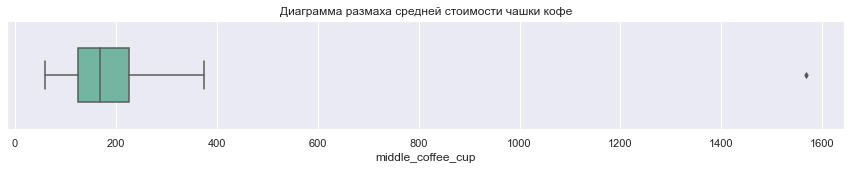

In [44]:
# посмотрим выбросы значений средней чашки кофе

sns.set(rc={'figure.figsize':(15,2)})
ax = sns.boxplot(x='middle_coffee_cup', y=None, data=data, palette="Set2", width=0.5, fliersize=4)
ax.set_title('Диаграмма размаха средней стоимости чашки кофе')
ax.set;

Есть один выброс. Посмотрим, где продают такой дорогой кофе.

In [45]:
data.query('middle_coffee_cup == middle_coffee_cup.max()')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,AO,around_the_clock
2859,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.78,37.71,4.20,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.00,1,48.00,Большая Семёновская улица,ВАО,False


Здесь явная опечатка при заполнении, чашка капучино в Шоколаднице столько не стоит. Заменим ошибочное значение на медианное по сети Шоколадница.

In [46]:
data.loc[data['middle_coffee_cup'] == 1568, 'middle_coffee_cup'] = (
    data
    .query('name == "Шоколадница"')['middle_coffee_cup']
    .median()
    )

In [47]:
# check

data['middle_coffee_cup'].max()

375.0

### 3.13. Столбец ```chain```

In [48]:
# оценим пропуски в столбце с информацией о сети

data['chain'].isna().sum()

0

In [49]:
# посмотрим, сколько сетевых заведений всего

data_chains = data.query('chain == 1')
data_chains.shape[0]

3205

In [50]:
# посмотрим, сколько уникальных сетей представлено в датасете

data_chains['name'].nunique()

762

In [51]:
# посмотрим, что вообще считается сетью

rests_in_chains = data_chains.groupby('name', as_index=False).agg({'address':'count'}).sort_values(by='address')
rests_in_chains.head()

,name,address
0,1-я Креветочная,1
246,Бакинский дворик,1
656,Уйгурский лагман,1
64,Deli2Go,1
247,Баку,1


Итак, как мы видим, в некоторых сетях почему-то всего одно заведение. В рамках данного исследования будем называть сетью набор из минимум 2ух заведений в Москве. А для данных заведений поменяем идентификатор сети на 0.

In [52]:
# составим список из "псевдосетей"

lst_of_wrong_chains = list(rests_in_chains.query('address == 1')['name'])

In [53]:
'{:.2%}'.format(len(lst_of_wrong_chains)/rests_in_chains['name'].nunique())

'8.40%'

8.4% сетей оказались "псевдосетями".

In [54]:
# превратим "псевдосети" в единичные заведения

data.loc[data['name'].isin(lst_of_wrong_chains), 'chain'] = 0

In [55]:
#check 

data_chains = data.query('chain == 1')
data_chains.shape[0]

3141

### 3.14. Столбец ```seats```

In [56]:
# оценим пропуски в столбце с посадочными местами

data['seats'].isna().sum()

3611

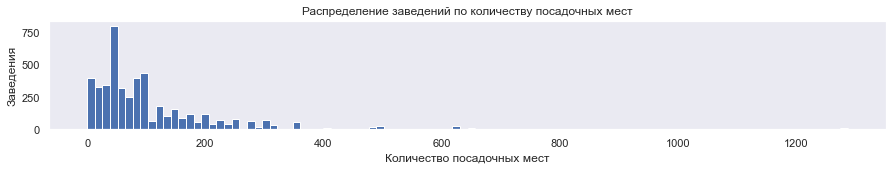

In [57]:
# посмотрим распределение заведений по посадочным местам

data['seats'].hist(bins=100)
plt.title('Распределение заведений по количеству посадочных мест')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Заведения')
plt.grid(False);

In [58]:
np.percentile(data.loc[data['seats'].notna(), 'seats'], [95,99])

array([307., 625.])

Заведения, в которых больше 300 посадочных мест можно считать большими. 99% заведений обеспечивает посадку в пределах 625 мест.

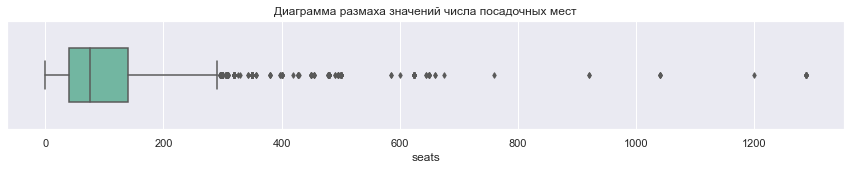

In [59]:
# посмторим выбросы для числа посадочных мест

sns.set(rc={'figure.figsize':(15,2)})
ax = sns.boxplot(x='seats', y=None, data=data, palette="Set2", width=0.5, fliersize=4)
ax.set_title('Диаграмма размаха значений числа посадочных мест')
ax.set;

Есть заведения, у которых нет посадчных мест, а также подозрительно много посадочных мест 900-1300.

In [60]:
# заведение с максимальным числом посадочных мест

data.query('seats > 900')[['name','category','seats']].sort_values(by='seats', ascending=False)

,name,category,seats
6574,Мюнгер,пиццерия,1288.00
6641,One Price Coffee,кофейня,1288.00
6808,Яндекс Лавка,ресторан,1288.00
6807,Loft-cafe академия,кафе,1288.00
6771,Точка,кафе,1288.00
6690,Японская кухня,ресторан,1288.00
6684,Пивной ресторан,"бар,паб",1288.00
6658,ГудБар,"бар,паб",1288.00
6838,Alternative coffee,кофейня,1288.00
6524,Ян Примус,ресторан,1288.00


Анализ показал, что "Ваня и Гоги" вмещают до 60 человек, но никак не 1040. А Яндекс.Лавка вообще, например, не ресторан.

На момент проведения анализа Eataly уже не работает. Он представлял собой гастро-маркет с большим количеством различных корнеров с общим залом на 920 мест. Стейк&Бургер с таким же количеством посадочных мест находился там же. Оба они уже не существуют. Удалим их из датасета.

In [61]:
# удалим из датасета аномальные заведения по количеству посадочных мест больше 900

data = data.query('seats <=900 or seats.isna()')

#check
data.shape[0]

8386

In [62]:
# посмотрим на нулевые посадочные места

street_food = data.query('seats == 0')[['name','category','seats']].sort_values(by='seats')
street_food.head(10)

,name,category,seats
84,Meat Doner Kebab,булочная,0.00
7360,Иссык-Куль,кафе,0.00
7341,MYration,кафе,0.00
7340,Take and Wake,кофейня,0.00
7321,Адыгская кухня,кафе,0.00
7319,Здрасте,кафе,0.00
7314,Dон Хулио,кафе,0.00
7311,Monkey Pizza,ресторан,0.00
7306,Manny's Burger,"бар,паб",0.00
7305,One Price Coffee,кофейня,0.00


Здесь, скорее всего речь идет о стрит-фуде, фаст-фуде и корнерах на фуд-кортах. Оставим их.

In [63]:
# всего заведений без посадки

street_food.shape[0]

136

In [64]:
# всего в результате предобработки пришлось удалить 

'{:.2%}'.format(1 - data.shape[0]/8604)

'2.53%'

### 3.15. Вывод после предобработки данных

В датасете была представлена информация о 8406 заведениях Москвы.
После предобработки данных количество заведений сократилось на 2,53%.

В датасете представлены заведения категорий:
- кафе, 
- ресторан,
- кофейня, 
- пиццерия,
- бар,паб,
- быстрое питание,
- булочная, 
- столовая

В датасете представлены сетевые и несетевые заведения. В рамках данного исследования сетями будем считать те, что имеют минимум 2 заведения в Москве.

В датасете продставлены:

- Северный административный округ,
- Северо-Восточный административный округ,
- Северо-Западный административный округ,
- Западный административный округ,
- Центральный административный округ,
- Восточный административный округ,
- Юго-Восточный административный округ,
- Южный административный округ,
- Юго-Западный административный округ.

В исследовании не участвуют Зеленоградский, Троицкий и Новомосковский округа.



## 4. Исследовательский анализ данных

###  4.1. Распеределение заведений по категориям

In [65]:
# группируем заведения по категориям

category_count = (
                    data
                    .groupby('category', as_index=False)
                    .agg({'name':'count'})
                    .sort_values(by='name', ascending=False)
                    )
category_count.columns = ['category', 'count']

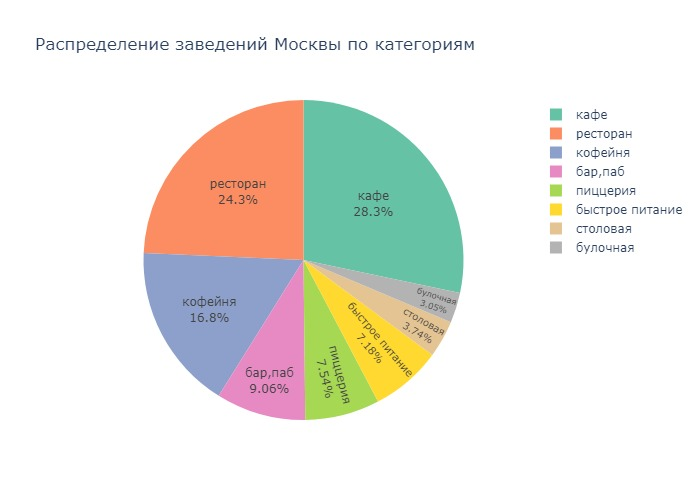

In [66]:
# строим распределение заведений по категориям

fig = px.pie(
             category_count,
             values='count',
             names='category',
             title='Распределение заведений Москвы по категориям',
             color_discrete_sequence=px.colors.qualitative.Set2,
             )

fig.update_traces(
                  textposition='inside',
                  textinfo='percent+label'
                        )
fig.show(renderer='jpeg')

Топ-3 категорий заведений по популярности:
- кафе - **28.3%**
- ресторан - **24.3%**
- кофейня - **16.8%**

### 4.2. Распеределение посадочных мест по категориям заведений

In [67]:
# группируем посадочные места по категориям

category_seats = (
                  data       
                    .query('seats.notna()')
                    .groupby('category', as_index=False)
                    .agg({'seats':'median'})
                    .sort_values(by='seats', ascending=False)
                    .reset_index(drop=True)
                    )
category_seats

,category,seats
0,ресторан,86.00
1,"бар,паб",82.00
2,кофейня,80.00
3,столовая,75.00
4,быстрое питание,65.00
5,кафе,60.00
6,пиццерия,53.50
7,булочная,50.00


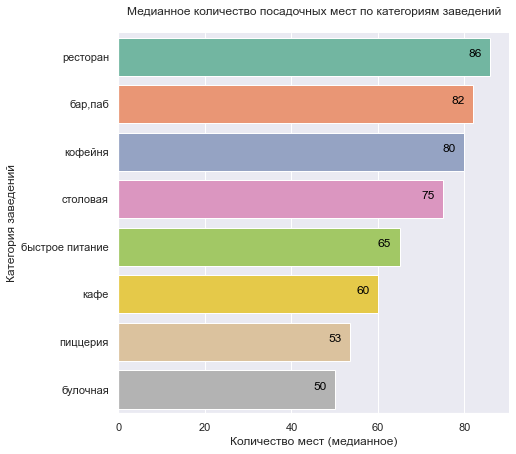

In [68]:
# построим медианное количесвто посадочных мест по категориям

fig, ax = plt.subplots(figsize = (7, 7))
sns.despine()
sns.set_style('white')

sns.barplot(data=category_seats, x='seats', y='category', palette='Set2')

plt.title('Медианное количество посадочных мест по категориям заведений\n')
plt.xlabel('Количество мест (медианное)')
plt.ylabel('Категория заведений')

for i, j in enumerate(category_seats['seats'].values):
    ax.text(j - 5, i, s = j.astype('int'), color = 'black', fontsize = 12)
    
plt.show()

Большинство заведений Москвы имеет в пределах 50-90 посадочных мест.
Лидеры по посадочным местам:
- рестораны
- бары, пабы
- кофейни

### 4.3. Соотношение сетевых и несетевых заведений в датасете

In [69]:
# выделим сетевые и несетевые рестораны

chain_rest = data.groupby('chain', as_index=False).agg({'name':'count'})
chain_rest.columns = ['is_chain', 'count']
chain_rest.loc[chain_rest['is_chain'] == 0, 'is_chain'] = 'не сетевой'
chain_rest.loc[chain_rest['is_chain'] == 1, 'is_chain'] = 'сетевой'
chain_rest

,is_chain,count
0,не сетевой,5254
1,сетевой,3132


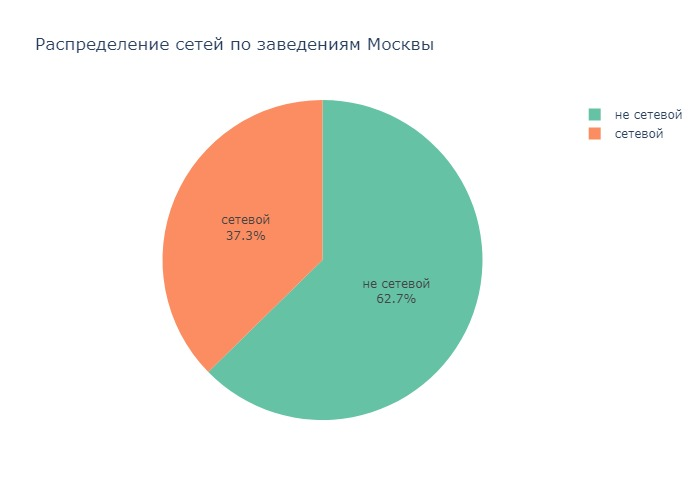

In [70]:
# визуализируем соотношение сетевых и несетевых заведений

fig = px.pie(
             chain_rest,
             values='count',
             names='is_chain',
             title='Распределение сетей по заведениям Москвы',
             color_discrete_sequence=px.colors.qualitative.Set2,
             )

fig.update_traces(
                  textposition='inside',
                  textinfo='percent+label'
                        )
fig.show(renderer='jpeg')

**Соотношение сетевых заведений к несетевым примерно 1 к 2.**

### 4.4. Соотнешение сетевых и несетевых заведений по категориям

In [71]:
# группируем данные по сетям и категориям

category_data = (data
                .groupby('category', as_index=False)
                .agg({'name':'count', 'chain':'sum'})
                .sort_values(by='name', ascending=False)
                )
category_data['chain_ratio'] = category_data['chain'] / category_data['name'] * 100
category_data  = category_data.sort_values(by='chain_ratio', ascending=False)

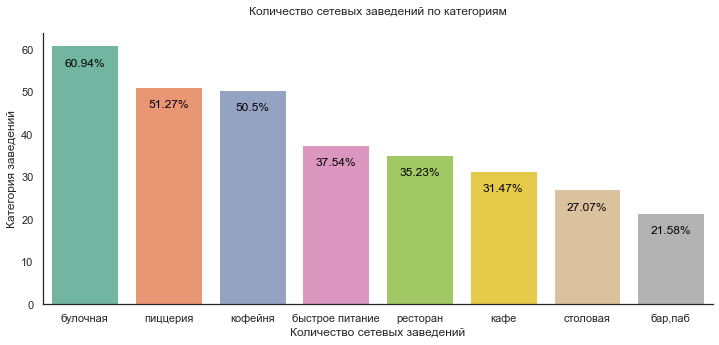

In [72]:
# смотрим, какие категории заведений чаще бывают сетевыми

fig, ax = plt.subplots(figsize=(12, 5))
sns.set_color_codes('pastel')
sns.set_style('white')
sns.despine()

sns.barplot(data=category_data, x='category', y='chain_ratio', palette='Set2')

plt.title('Количество сетевых заведений по категориям\n')
plt.xlabel('Количество сетевых заведений')
plt.ylabel('Категория заведений')

for i, j in enumerate(category_data['chain_ratio'].values):
    ax.text(i, j-5, s = str(round(j, 2))+'%', color = 'black', fontsize = 12, ha='center')
    
plt.show();

Чаще всего сетевыми бывают булочные, пиццерии, кофейни.

Столовые и бары редко бывают сетевыми.

### 4.5. Самые популярные сети заведений Москвы

In [73]:
# группируем сети по названиям и определяем топ-15 по популярности

top_15_chains = (
                data.query('chain == 1')
                    .groupby('name', as_index=False)
                    .agg({'address':'count'})
                    .sort_values(by='address', ascending=False)
                    .reset_index(drop=True)
                    .head(15)
                )
top_15_chains.columns = ['name','count']

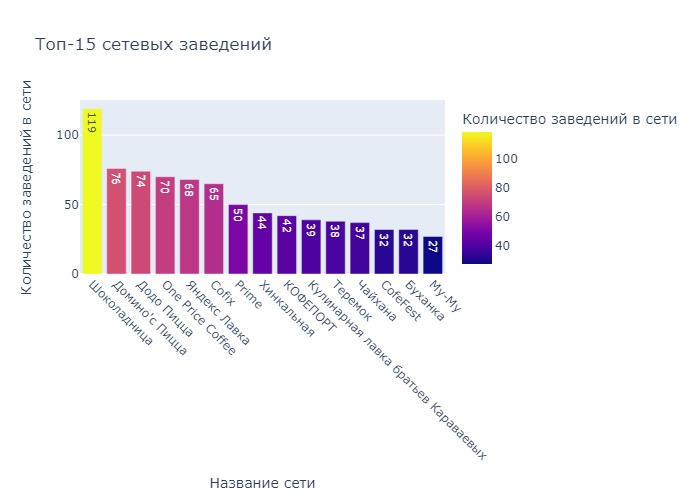

In [74]:
# смотрим распределение Топ-15 сетей по количесвту заведений

fig = px.bar(top_15_chains, x='name', y='count', title='Топ-15 сетевых заведений',
             color='count',
             height=500,
            labels={'count':'Количество заведений в сети', 'name':'Название сети'},
            text_auto=True)
fig.update_xaxes(tickangle=45)
fig.show(renderer='jpeg')


Безусловный лидер по количеству заведений среди сетей Москвы - "Шоколадница".

In [75]:
# составим список названий сетей из ТОП-15 

top_chains_names = list(top_15_chains['name'])

# выделим всю информацию о них из датасета

data_top_chains = data.query('name in @top_chains_names')
data_top_chains.shape[0]

813

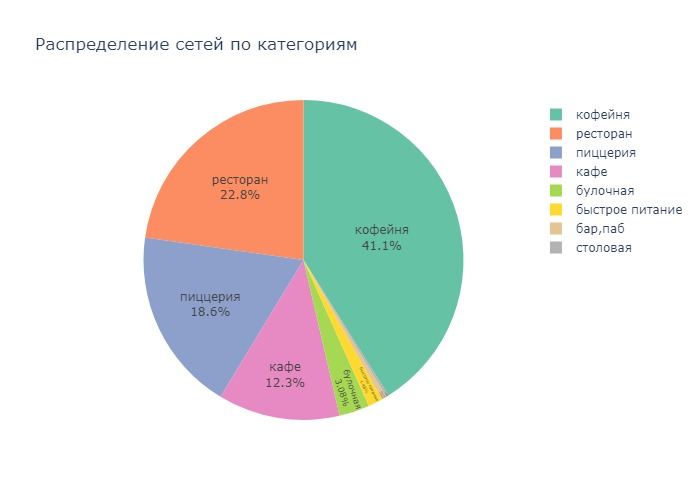

In [76]:
# посмотрим, как распределяются категории среди Топ-15 сетевых заведений

fig = px.pie(
             (
                 data_top_chains.groupby('category', as_index=False)
                 .agg({'name':'count'})
                 .sort_values(by='name', ascending=False)
             ),
             values='name',
             names='category',
             title='Распределение сетей по категориям',
             color_discrete_sequence=px.colors.qualitative.Set2,
             )
fig.update_traces(
                  textposition='inside',
                  textinfo='percent+label'
                        )
fig.show(renderer='jpeg')

**Итак, среди сетевых заведений лидируют кофейни, рестораны и пиццерии.**

In [77]:
# сгруппируем сети по районам

chains_in_districts = (data.query('chain == 1')
                        .groupby('AO', as_index=False)
                        .agg({'name':'count'})
                      )                      

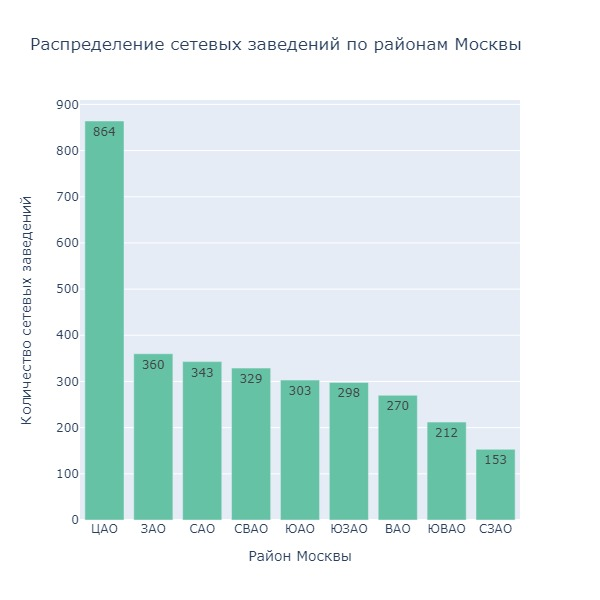

In [78]:
# смотрим распределение сетевых заведений по районам Москвы

fig = px.bar(chains_in_districts,
             x='AO',
             y='name',
             title='Распределение сетевых заведений по районам Москвы',
             height=600,
             width=600,
             labels={'AO':'Район Москвы', 'name':'Количество сетевых заведений'},
             color_discrete_sequence=px.colors.qualitative.Set2,
             text_auto=True
            )
fig.update_xaxes(categoryorder='total descending')
fig.show(renderer='jpeg')

Очевидно, что большинство сетей сконцентрировано в центре. Однако, это вполне справедливо для любых заведений.

Возможно, в целом, распределение заведений по районам одинаковое вне зависимости от факта вхождения заведения в сеть.

Рассмотрим эту гипотезу в следующем пункте.

### 4.6. Распределение заведений по районам

В датасете продставлены:

- Северный административный округ,
- Северо-Восточный административный округ,
- Северо-Западный административный округ,
- Западный административный округ,
- Центральный административный округ,
- Восточный административный округ,
- Юго-Восточный административный округ,
- Южный административный округ,
- Юго-Западный административный округ.


В исследовании не участвуют Зеленоградский, Троицкий и Новомосковский округа.

Посмотрим, как распределеяются сетевые и несетевые заведения по районам

In [79]:
# группируем данные по сетям и районам

chain_district = (data
                .groupby('district', as_index=False)
                .agg({'name':'count', 'chain':'sum'})
                .sort_values(by='name', ascending=False)
                )
chain_district['chain_ratio'] = round(chain_district['chain'] / chain_district['name'] * 100, 2)
chain_district = chain_district.sort_values(by='chain_ratio', ascending=False)
chain_district

,district,name,chain,chain_ratio
1,Западный административный округ,837,360,43.01
7,Юго-Западный административный округ,709,298,42.03
5,Центральный административный округ,2242,864,38.54
2,Северный административный округ,899,343,38.15
4,Северо-Западный административный округ,409,153,37.41
3,Северо-Восточный административный округ,891,329,36.92
8,Южный административный округ,891,303,34.01
0,Восточный административный округ,794,270,34.01
6,Юго-Восточный административный округ,714,212,29.69


In [80]:
# визуализируем распределение сетевых заведений по районам

# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
with open(r'C:\Users\N\OneDrive\Desktop\study\ipynb\my projects\project_7_central_perk\admin_level_geomap.geojson',
          encoding='utf-8') as f:
    state_geo = json.load(f) 

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
Msk_chain = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
cp = folium.Choropleth(
    geo_data=state_geo,
    data=chain_district,
    columns=['district', 'chain_ratio'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    line_opacity=0.5,
    legend_name='Доля сетевых заведений',
).add_to(Msk_chain)

# создаем индексированную копию датасета для поиска нужных значений
chain_district_ind = chain_district.set_index('district')

# цикл для присваивания объекту json нового свойства
for s in cp.geojson.data['features']:
    s['properties']['chain_ratio'] = chain_district_ind.loc[s['name'], 'chain_ratio']
    
# добавление всплывающей подсказки при наведении курсора на choropleth geojson
folium.GeoJsonTooltip(['name', 'chain_ratio']).add_to(cp.geojson)

# выводим карту
Msk_chain

Действительно, сетевые и несетевые заведения распределены по районам примерно одинаково: 30-40% заведений в каждом районе являются сетевыми. Что подтверждает выводы, сделанные выше.

Лидерами по числу сетевых заведений являются ЗАО и ЮЗАО. Меньше всего сетевых заведений в ЮВАО.

### 4.7. Распределение заведений по категориям и по районам

In [81]:
# составляем сводную таблицу по районам и категориям

category_district = data.pivot_table(index='AO',
                                     columns='category',
                                     values='name',
                                     aggfunc='count')
category_district['total'] = category_district.sum(axis=1)

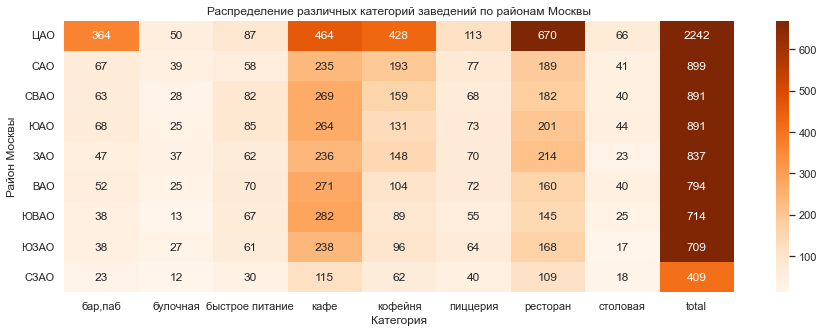

In [82]:
# рисуем распределение различных категорий по районам

fig, ax = plt.subplots(figsize=(15, 5))
sns.heatmap(category_district.sort_values(by='total',ascending=False),
            annot=True,
            fmt=".0f",
            vmin=12,
            vmax=670,
            cmap="Oranges")
plt.title('Распределение различных категорий заведений по районам Москвы')
plt.xlabel('Категория')
plt.ylabel('Район Москвы');

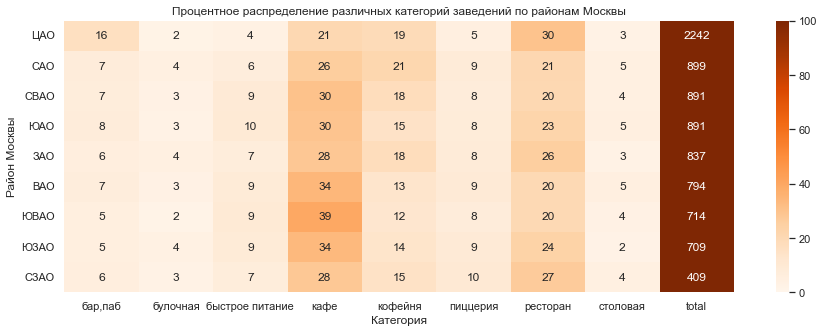

In [83]:
# смотрим процентное распределение различных категорий по районам

for col in ['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']:
    category_district[col] = category_district[col] / category_district['total'] * 100
    
fig, ax = plt.subplots(figsize=(15, 5))
sns.heatmap(category_district.sort_values(by='total',ascending=False),
            annot=True,
            fmt=".0f",
            vmin=0,
            vmax=100,
            cmap="Oranges")
plt.title('Процентное распределение различных категорий заведений по районам Москвы')
plt.xlabel('Категория')
plt.ylabel('Район Москвы');

**Больше всего заведенний ожидаемо находится в ЦАО, в остальных районах общее количество заведений сопоставимо.
Больше всего в ЦАО втсречается рестранов - 30%, кафе - 21%, кофеен - 19% и баров и пабов - 16%.
В других районах большей популярностью пользуются рестораны, кафе и кофейни.**

### 4.8. Распределение рейтингов заведений

In [84]:
# группируем заведения по категориям и среднему рейтингу

category_rating = (
                    data
                        .groupby('category')
                        .agg({'rating':'mean'})
                        .sort_values(by='rating', ascending=False)
                        )

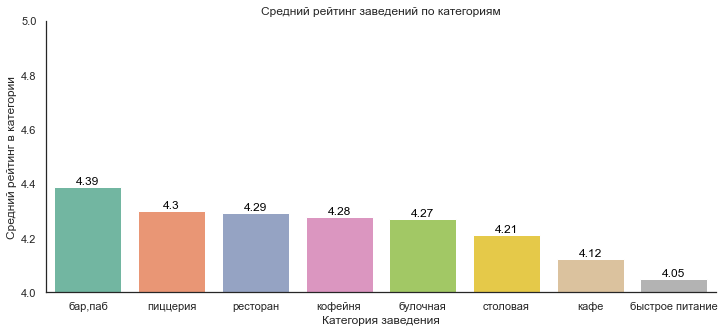

In [85]:
# смотрим, какие категории имеют больший средний рейтинг

fig, ax = plt.subplots(figsize=(12, 5))
sns.set_style('white')
sns.despine()

sns.barplot(data=category_rating, x=category_rating.index, y='rating', palette='Set2')

plt.title('Средний рейтинг заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Средний рейтинг в категории')
plt.ylim(4,5)  
  
for i, j in enumerate(category_rating['rating'].values):
    ax.text(i, j + 0.01, s = str(round(j, 2)), color = 'black', fontsize = 12, ha='center')
    
plt.show();

**Cредний рейтинг слабо зависит от категории заведения. Однако при приближенном рассмотрении видно, что рейтинги заведения быстрого питания и кафе не поднимаются выше 4,2; а все остальные категориии не достигают рейтинга в 4,5. В целом средний рейтинг во всех категориях находится в промежутке между 4 и 4,5.**

Посмотрим распределение рейтингов заведений по районам Москвы.

In [86]:
# группируем заведения по району и находим медианный рейтинг

data_rating = data.groupby('district', as_index=False).agg({'rating':'median'})

In [87]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
with open(r'C:\Users\N\OneDrive\Desktop\study\ipynb\my projects\project_7_central_perk\admin_level_geomap.geojson',
          encoding='utf-8') as f:
    state_geo = json.load(f)

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
Msk = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
cp = folium.Choropleth(
    geo_data=state_geo,
    data=data_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    line_opacity=0.5,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(Msk)

# создаем индексированную копию датасета для поиска нужных значений
data_rating_ind = data_rating.set_index('district')

# цикл для присваивания объекту json нового свойства
for s in cp.geojson.data['features']:
    s['properties']['rating'] = data_rating_ind.loc[s['name'], 'rating']
    
# добавление всплывающей подсказки при наведении курсора на choropleth geojson
folium.GeoJsonTooltip(['name', 'rating']).add_to(cp.geojson)

# выводим карту
Msk

**Распределение медианных рейтингов по районам показывает, что самые высокие рейтинги в ЦАО, а самые низкие - в СВАО и ЮВАО.**

### 4.9. Распределение заведений по всей Москве

Визуализируем распределение всех заведений по Москве.

In [88]:
# подключаем библиотеку
from folium import Marker, Map

# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта, moscow_lng – долгота
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)
    
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",
    ).add_to(marker_cluster)

# применяем функцию для создания кластеров на карте
data.apply(create_clusters, axis=1)
    
# выводим карту
m

Визуализируем распределение заведений по районам Москвы.

In [89]:
# распределение заведений по районам

rest_by_distr = data.groupby('district', as_index=False)['name'].count()
rest_by_distr.columns = ['district', 'count']
rest_by_distr.head(3)

,district,count
0,Восточный административный округ,794
1,Западный административный округ,837
2,Северный административный округ,899


In [90]:
# визуализируем распределение заведений по районам

# загружаем JSON-файл с границами округов Москвы
with open(r'C:\Users\N\OneDrive\Desktop\study\ipynb\my projects\project_7_central_perk\admin_level_geomap.geojson',
          encoding='utf-8') as f:
    state_geo = json.load(f)
    
# создаём карту Москвы
Moscow = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
cp = folium.Choropleth(
    geo_data=state_geo,
    data=rest_by_distr,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    line_opacity=0.5,
    legend_name='Количество заведений'
).add_to(Moscow)

# создаем индексированную копию датасета для поиска нужных значений
rest_by_distr_ind = rest_by_distr.set_index('district')
rest_by_distr_ind['count'] = rest_by_distr_ind['count'].astype('float') 

# цикл для присваивания объекту json нового свойства
for s in cp.geojson.data['features']:
    s['properties']['count'] = rest_by_distr_ind.loc[s['name'], 'count']
    
# добавление всплывающей подсказки при наведении курсора на choropleth geojson
folium.GeoJsonTooltip(['name', 'count']).add_to(cp.geojson)

# выводим карту
Moscow

### 4.10. Распределение улиц по популярности

In [91]:
# группируем заведения по улицам и находим Топ-15

streets = data.groupby('street').agg({'name':'count'}).sort_values(by='name', ascending=False)
top_streets = streets.head(15)
top_streets

,name
street,
проспект Мира,184
Профсоюзная улица,122
Ленинский проспект,107
проспект Вернадского,97
Ленинградский проспект,95
Дмитровское шоссе,87
Варшавское шоссе,76
Каширское шоссе,76
Ленинградское шоссе,70


In [92]:
# выделяем датасет для Топ-15 улиц

data_top_streets = data.query('street in @top_streets.index')

In [93]:
streets_category = data_top_streets.pivot_table(
                            index='street',
                            columns='category',
                            values='name',
                            aggfunc='count'
                            ).fillna(0)

# общее число заведенений для каждой улицы

streets_category['total'] = streets_category.sum(axis=1)

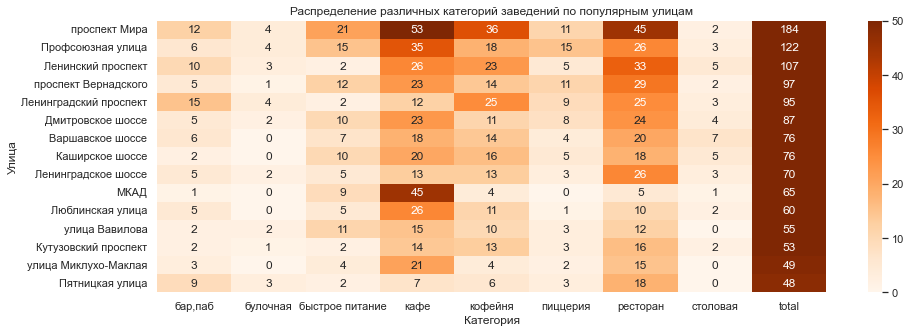

In [94]:
# рисуем распределение различных категорий по Топ-15 улицам

fig, ax = plt.subplots(figsize=(15, 5))
sns.heatmap(streets_category.sort_values(by='total', ascending=False),
            annot=True,
            fmt=".0f",
            vmin=0,
            vmax=50,
            cmap="Oranges")
plt.title('Распределение различных категорий заведений по популярным улицам')
plt.xlabel('Категория')
plt.ylabel('Улица');

In [95]:
# находим долю категорий для Топ-15 улиц

for col in ['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']:
    streets_category[col] = streets_category[col] / streets_category['total'] * 100

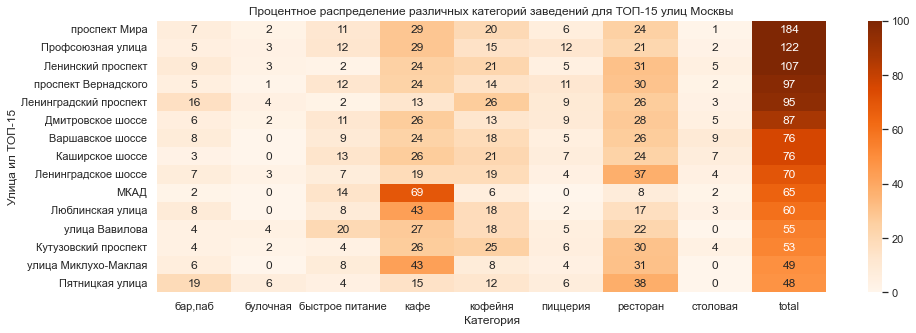

In [96]:
# рисуем процентное распределение различных категорий по Топ-15 улиц

fig, ax = plt.subplots(figsize=(15, 5))
sns.heatmap(streets_category.sort_values(by='total',ascending=False),
            annot=True,
            fmt=".0f",
            vmin=0,
            vmax=100,
            cmap="Oranges")
plt.title('Процентное распределение различных категорий заведений для ТОП-15 улиц Москвы')
plt.xlabel('Категория')
plt.ylabel('Улица ил ТОП-15');

**На Топ-15 по популярности улицах наблюдается та же тенденция: большей популярностью пользуются рестораны, кафе и кафейни.**

In [97]:
# выделим самые непопулярные улицы

no_pop_streets = list(streets.query('name == 1').index)
data_no_pop_streets = data.query('street in @no_pop_streets')

In [98]:
# создаём новую карту Москвы
Msc = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(Msc)
# применяем функцию для создания кластеров на карте
data_no_pop_streets.apply(create_clusters, axis=1)
    
# выводим карту
Msc

In [99]:
# распределение категорий по непопулярным улицам 

data_no_pop_streets['category'].value_counts()

кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

Малое число заведений (одно) встречается на 458 улицах Москвы (это примерно 1/3 всех улиц, представленных в данных).

Большинство таких улиц сконцентрировано в центре, т.е. они либо короткие, либо у них нет свободного подъезда, либо здания находятся под защитой, как объекты культуры и наследия.

Чаще всего, если на улице 1 заведение, то это кафе.

Также такие "одинокие" заведения встречаются там, где ограничена проходимость людей и где есть один объект, под который и открывалось заведение (храм, мечеть, ЖК и т.д.)

Также, возможно, данные не полные, и на этих улицах могут быть еще заведения.

### 4.11. Распределение среднего чека

In [100]:
# определим средний чек по району

avg_bill_district = (
                    data
                    .groupby('district', as_index=False)
                    .agg({'middle_avg_bill':'median'})
                    .sort_values(by='middle_avg_bill', ascending=False)
                    )
avg_bill_district

,district,middle_avg_bill
1,Западный административный округ,1000.00
5,Центральный административный округ,1000.00
4,Северо-Западный административный округ,700.00
2,Северный административный округ,650.00
7,Юго-Западный административный округ,600.00
0,Восточный административный округ,550.00
3,Северо-Восточный административный округ,500.00
8,Южный административный округ,500.00
6,Юго-Восточный административный округ,450.00


In [101]:
# визуализируем распределение среднего чека по районам

# загружаем JSON-файл с границами округов Москвы
with open(r'C:\Users\N\OneDrive\Desktop\study\ipynb\my projects\project_7_central_perk\admin_level_geomap.geojson',
          encoding='utf-8') as f:
    state_geo = json.load(f)
    
# создаём карту Москвы
Mscw = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
cp = folium.Choropleth(
    geo_data=state_geo,
    data=avg_bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    line_opacity=0.5,
    legend_name='Медианный средний чек заведений по районам',
).add_to(Mscw)

# создаем индексированную копию датасета для поиска нужных значений
avg_bill_ind = avg_bill_district.set_index('district')

# цикл для присваивания объекту json нового свойства
for s in cp.geojson.data['features']:
    s['properties']['middle_avg_bill'] = avg_bill_ind.loc[s['name'], 'middle_avg_bill']
    
# добавление всплывающей подсказки при наведении курсора на choropleth geojson
folium.GeoJsonTooltip(['name', 'middle_avg_bill']).add_to(cp.geojson)

# выводим карту
Mscw

**По имеющимся данным очевидно, что чем "дороже" район, тем выше там средний чек.**

**ЦАО и ЗАО считаются самыми дорогими районами Москвы. Отдельно на западе выделяется аэропорт - опять же в аэропортах всегда дороже еда.**

### 4.12. Режим работы заведений 

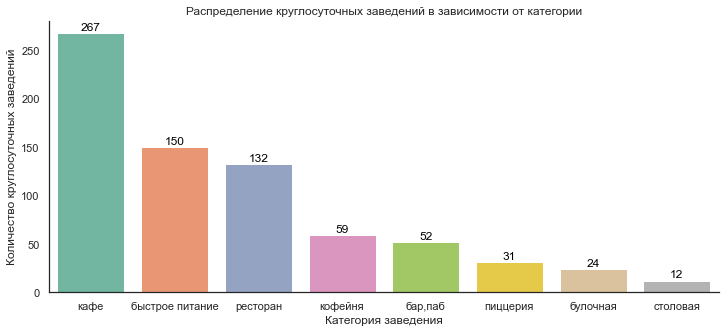

In [102]:
# датасет с круглосуточными заведениями

round_clock = (data
               .query('around_the_clock == 1')
               .groupby('category')
               .agg({'name':'count'})
               .sort_values(by='name', ascending=False)
              )
# посмотрим распределение круглосуточных заведений по категориям

fig, ax = plt.subplots(figsize=(12, 5))
sns.set_style('white')
sns.despine()

sns.barplot(data=round_clock, x=round_clock.index, y='name', palette='Set2')

plt.title('Распределение круглосуточных заведений в зависимости от категории')
plt.xlabel('Категория заведения')
plt.ylabel('Количество круглосуточных заведений')

for i, j in enumerate(round_clock['name'].values):
    ax.text(i, j + 3, s = str(round(j, 2)), color = 'black', fontsize = 12, ha='center')
    
plt.show();
    

In [103]:
# посмторим распределение круглосуточных заведений в Москве

# создаём новую карту Москвы
Ms = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(Ms)
# применяем функцию для создания кластеров на карте
data.query('around_the_clock == 1').apply(create_clusters, axis=1)
    
# выводим карту
Ms

**Большинство круглосуточных заведений, работающих без выходных - кафе. Также часто круглосуточными бывают заведения быстрого питания и рестораны.**
**Количество круглосуточных заведений преобладает в центре Москвы.**

## 5. "Central Perk"

In [104]:
# выделим из датасета только кофейни

data_coffee = data.query('category == "кофейня"')

In [105]:
# удаляем непопулярные улицы, так как непонятно, какая с ними проблема

data_coffee = data_coffee.query('street not in @no_pop_streets')

In [106]:
# сколько всего кофеен

data_coffee.shape[0]

1326

### 5.1. Распределение кофеен по раойонам Москвы

In [107]:
# распределение кофеен по районам

data_coffee_dist = (
                data_coffee
                .groupby('district', as_index=False)
                .agg({'name':'count'})
                .sort_values(by='name', ascending=False)
                .reset_index(drop=True)
)

data_coffee_dist.columns = ['district', 'count']
data_coffee_dist.head(3)

,district,count
0,Центральный административный округ,394
1,Северный административный округ,180
2,Северо-Восточный административный округ,149


In [108]:
# визуализируем распределение кофеен по районам

# загружаем JSON-файл с границами округов Москвы
with open(r'C:\Users\N\OneDrive\Desktop\study\ipynb\my projects\project_7_central_perk\admin_level_geomap.geojson',
          encoding='utf-8') as f:
    state_geo = json.load(f)
    
# создаём карту Москвы
Mscw_coffee = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
cp = folium.Choropleth(
    geo_data=state_geo,
    data=data_coffee_dist,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    line_opacity=0.5,
    legend_name='Количество кофеен',
).add_to(Mscw_coffee)

# создаем индексированную копию датасета для поиска нужных значений
coffee_dist_ind = data_coffee_dist.set_index('district')
coffee_dist_ind['count'] = coffee_dist_ind['count'].astype('float')

# цикл для присваивания объекту json нового свойства
for s in cp.geojson.data['features']:
    s['properties']['count'] = coffee_dist_ind.loc[s['name'], 'count']
    
# добавление всплывающей подсказки при наведении курсора на choropleth geojson
folium.GeoJsonTooltip(['name', 'count']).add_to(cp.geojson)

# выводим карту
Mscw_coffee

Разумеется, большинство кофеен расположено в ЦАО. А вот в СЗАО, ВАО, ЮВАО и ЮЗАО наблюдается "дефицит" кофеен.

Посмотрим конкуренцию среди кофеен на Топ-15 популярных улицах.

In [109]:
# список кофеен на Топ-15 популярных улицах

coffee_top_15 = data_coffee.query('street in @top_streets.index')

In [110]:
# посмторим распределение кофеен на Топ-15 улицах

# создаём новую карту Москвы
Ms_top = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(Ms_top)
# применяем функцию для создания кластеров на карте
coffee_top_15.apply(create_clusters, axis=1)
    
# выводим карту
Ms_top

В целом, видно, что улицы из Топ-15 очень длинные, поэтому большое число кофеен на этих улицах может быть обусловлено их протяженностью. Следовательно, если тщательно выбрать локацию, то конкуренция может оказаться не такой жесткой.

### 5.2. Круглосуточные кофейни

In [111]:
# посмотрим сколько круглосуточных кофеен есть в датасете
(
data_coffee.query('around_the_clock != "unknown"')
            .groupby('around_the_clock', as_index=False)
            .agg({'name':'count'})
)

,around_the_clock,name
0,False,1255
1,True,57


In [112]:
# группируем круглосуточные кофейни по районам

ar_the_clock_coffee = (data_coffee
                        .query('around_the_clock == True')
                        .groupby('AO', as_index=False).agg({'name':'count'})
                        .sort_values(by='name', ascending=False)
                    )
ar_the_clock_coffee

,AO,name
5,ЦАО,25
1,ЗАО,9
8,ЮЗАО,6
0,ВАО,5
2,САО,5
3,СВАО,3
4,СЗАО,2
6,ЮАО,1
7,ЮВАО,1


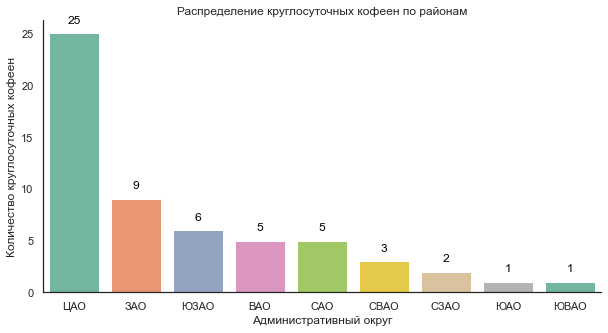

In [113]:
# посмотрим распределение круглосуточных кофеен по районам

fig, ax= plt.subplots(figsize=(10,5))
sns.set_style('white')
sns.despine()

sns.barplot(
            data=ar_the_clock_coffee,
            x='AO',
            y='name',
            palette='Set2'
            )

plt.title('Распределение круглосуточных кофеен по районам')
plt.xlabel('Административный округ')
plt.ylabel('Количество круглосуточных кофеен')

for i, j in enumerate(ar_the_clock_coffee['name'].values):
    ax.text(i, j+1, s = str(round(j, 2)), color = 'black', fontsize = 12, ha='center')
    
plt.show();


Круглосуточных кофеен всего около 5%, причем располагаются они преимущественно в центре.

### 5.3. Рейтинг кофеен

In [114]:
# медианный рейтинг кафеен

data_coffee['rating'].median()

4.3

In [115]:
# находим медианный рейтинг кофеен по районам

coffee_rating = (
                data_coffee
                .groupby('AO', as_index=False)
                .agg({'rating':'mean'})
                .sort_values(by='rating', ascending=False)
)

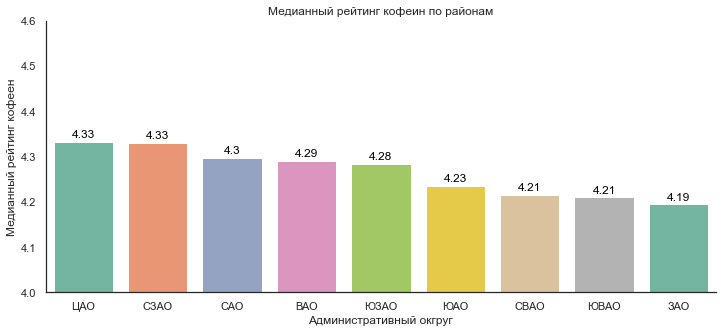

In [116]:
# посмотрим распределение медианного рейтинга по районам

fig, ax = plt.subplots(figsize=(12, 5))
sns.set_style('white')
sns.despine()
sns.barplot(data=coffee_rating,
            x='AO',
            y='rating',
           palette='Set2')

plt.title('Медианный рейтинг кофеин по районам')
plt.xlabel('Административный окгруг')
plt.ylabel('Медианный рейтинг кофеен')
plt.ylim(4,4.6)

for i, j in enumerate(coffee_rating['rating'].values):
    ax.text(i, j+0.01, s = str(round(j, 2)), color = 'black', fontsize = 12, ha='center')
    
plt.show();


**Рейтинг кофеен практически не зависит от района. В среднем он колеблется в промежутке 4.2-4.3.**

### 5.4. Средняя стоимость чашки кофе

In [117]:
data_coffee['middle_coffee_cup'].describe()

count    497.00
mean     171.88
std       66.24
min       60.00
25%      120.00
50%      167.00
75%      225.00
max      375.00
Name: middle_coffee_cup, dtype: float64

In [118]:
# медианная стоимость чашки кофе

data_coffee['middle_coffee_cup'].median()

167.0

In [119]:
# средняя чашка кофе

data_coffee['middle_coffee_cup'].mean()

171.87927565392354

Медианная и средняя стоимость чашки кофе близки и составляют около 170 рублей.

Однако, средняя стоимость чашки кофе может зависеть от района и рейтинга заведения.
Проверим это.

In [120]:
# посмотрим медианную стоимость чашки кофе в кофейнях с рейтингом выше среднего (от 4,5)

data_coffee.query('rating > 4.5')['middle_coffee_cup'].median()

165.0

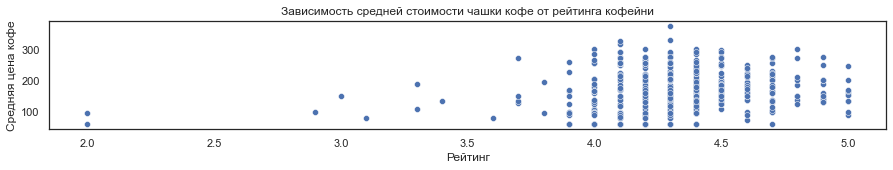

In [121]:
#посмотрим, зависит ли средняя стоимость чашки кофе от рейтинга заведения

sns.scatterplot(data=data_coffee.sort_values(by='rating'), x='rating', y='middle_coffee_cup')
plt.title('Зависимость средней стоимости чашки кофе от рейтинга кофейни')
plt.xlabel('Рейтинг')
plt.ylabel('Средняя цена кофе');

In [122]:
# смотрим есть ли корреляция между рейтингом кофейни и средней стоимостью кофе

"{:,.2f}".format(data_coffee['rating'].corr(data_coffee['middle_coffee_cup']))

'0.14'

Вывод: средняя стоимость чашки кофе не зависит от рейтинга заведения.

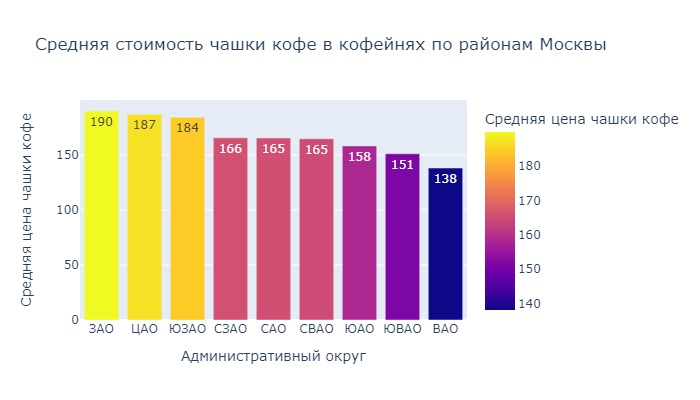

In [123]:
# посмотрим среднюю стоимость чашки кофе по районам

fig = px.bar(data_coffee
                        .groupby('AO', as_index=False)
                        .agg({'middle_coffee_cup':'mean'})
                        .sort_values(by='middle_coffee_cup', ascending=False), 
             x='AO',
             y='middle_coffee_cup',
            color='middle_coffee_cup',
            title='Средняя стоимость чашки кофе в кофейнях по районам Москвы',
            height=400,
            labels={'AO':'Административный округ', 'middle_coffee_cup':'Средняя цена чашки кофе'},
            text_auto=".0f"
            )

fig.show(renderer='jpeg')

По районам средняя цена чашки кофе отличается:
- для ЦАО, ЗАО и ЮЗАО - порядка 185-190 рублей;
- для СЗАО, САО, СВАО, ЮВАО - порядка 155-165 рублей;
- для ВАО - порядка 140 рублей.

Это стоит учитывать при выборе района размещения будущего кафе.

### 5.5. Посадка

In [124]:
# находим медианную посадку

data_coffee['seats'].median()

80.0

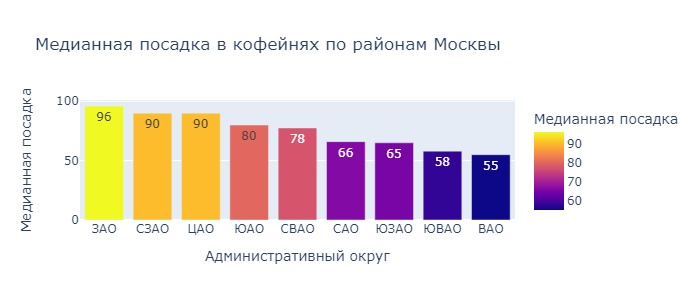

In [125]:
# посмотрим распределение посадочных мест в кофейнях по районам

fig = px.bar(data_coffee
                    .groupby('AO', as_index=False)
                    .agg({'seats':'median'})
                    .sort_values(by='seats', ascending=False), 
             x='AO',
             y='seats',
            color='seats',
            title='Медианная посадка в кофейнях по районам Москвы',
            height=300,
            labels={'AO':'Административный округ', 'seats':'Медианная посадка'},
            text_auto='.0f')

fig.show(renderer='jpeg')

По районам средняя цена посадки в кофейнях отличается:
- для ЦАО, ЗАО и СЗАО - порядка 90 посадочных мест;
- для ЮАО и СВАО - порядка 80 посадочных мест;
- для САО и ЮЗАО - порядка 65 посадочных мест;
- для ЮВАО и ВАО - порядка 55 посадочных мест.

Это стоит учитывать при выборе района размещения будущего кафе.

### 5.6. Средний чек

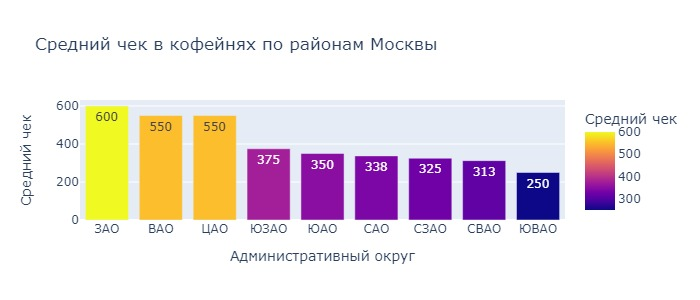

In [126]:
# посмотрим распределение среднего чека в кофейнях по районам

fig = px.bar(data_coffee
                    .groupby('AO', as_index=False)
                    .agg({'middle_avg_bill':'median'})
                    .sort_values(by='middle_avg_bill', ascending=False), 
             x='AO',
             y='middle_avg_bill',
            color='middle_avg_bill',
            title='Средний чек в кофейнях по районам Москвы',
            height=300,
            labels={'AO':'Административный округ', 'middle_avg_bill':'Средний чек'},
            text_auto='.0f')

fig.show(renderer='jpeg')

Средний чек по районам:
- ЗАО, ВАО, ЦАО - 550-600 рублей
- ЮЗАО, ЮАО, САО, СВАО - около 310-375 рублей
- ЮВАО - 250 рублей.

### 5.7. Анализ конкурентов

Так как планируется возсоздать кафе "Central Perk" из ситкома "F.R.I.E.N.D.S", был произведен обзор подобных заведений Москвы.

На данный момент в Москве 2 таких заведения:

- **"Френдс"**

адрес: Краснобогатырская ул., 90, стр. 2

средняя оценка: 4.5

cредний счёт: 400–700 ₽

средняя цена капучино: 260 ₽

- **"В гостях у Моники"**

адрес: ул. Покровка, 20/1с1

средняя оценка: 4.6

cредний счёт: 700–1200 ₽

средняя цена капучино: 260 ₽

- **планируется открыть еще одно заведение** этой сети и в этой тематике

адрес: ул. Покровка, д. 31, стр 1 

Все заведения данной тематике принадлежат одной сети. Информация о них была найдена на сайте сети:
https://friendsmsk.ru/

Внизу страницы есть информация об открытии нового заведения.

In [127]:
# вот эти заведения в датасетe

data.query('name == "Френдс" or name == "Френдс в гостях у Моники"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,AO,around_the_clock
2669,Френдс,"бар,паб","Москва, Краснобогатырская улица, 90, стр. 2",Восточный административный округ,"ежедневно, 08:00–23:00",55.80,37.71,4.50,средние,Средний счёт:400–700 ₽,550.00,NaN,0,52.00,Краснобогатырская улица,ВАО,False
4349,Френдс в гостях у Моники,"бар,паб","Москва, улица Покровка, 20/1с1",Центральный административный округ,"ежедневно, 09:00–00:00",55.76,37.65,4.60,средние,Средний счёт:700–1200 ₽,950.00,NaN,0,NaN,улица Покровка,ЦАО,False


Ниже представлено расположение данных заведений.

In [128]:
# сохраняем координаты Френдс в переменные
friends_lat, friends_lng = 55.801271, 37.710170

# сохраняем координаты У Моники в переменные
u_moniki_lat, u_moniki_lng = 55.758228, 37.647275

# сохраняем координаты новых друзей в переменные
new_friends_lat, new_friends_lng = 55.760715, 37.649637

# создаём карту Москвы
m_friends = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём маркер в точке расположения Френдс и сразу добавляем на карту
folium.Marker([friends_lat, friends_lng], tooltip='Френдс').add_to(m_friends)

# создаём маркер в точке расположения У Моники и сразу добавляем на карту
folium.Marker([u_moniki_lat, u_moniki_lng], tooltip='Френдс У Моники').add_to(m_friends)

# создаём маркер в точке расположения нового заведения и сразу добавляем на карту
folium.Marker([new_friends_lat, new_friends_lng], tooltip='Новое заведение Френдс').add_to(m_friends)

# выводим карту
m_friends

## 6. Выводы по исследовательскому анализу данных

### Исследованиие распределения заведений **по категориям**

Топ-3 среди всех заведений по популярности:
- кафе - **28.3%**
- ресторан - **24.3%**
- кофейня - **16.8%**

Средний рейтинг практически не зависит от категории заведения и находится в пределах от 4 до 4,5.

### Исследование **сетевых** заведений

Соотношение сетевых заведений к несетевым примерно 1 к 2.

Чаще всего сетевыми бывают булочные, пиццерии, кофейни. Безусловный лидер по количеству заведений среди сетей Москвы - "Шоколадница".

Столовые и бары редко бывают сетевыми.

Сетевые и несетевые заведения распределены по районам одинаково. 

### Распределение заведений **по районам Москвы**

Больше всего заведенний ожидаемо находится в **ЦАО** (около **26%**), в остальных районах общее количество заведений сопоставимо.

Больше всего в ЦАО втсречается рестранов - 29,9%, кафе - 20,7%, кофеен - 19,1% и баров и пабов - 16,2%.
В других районах большей популярностью пользуются рестораны, кафе и кофейни.

Распределение медианных рейтингов по районам показывает, что самые высокие рейтинги в ЦАО, а самые низкие - в СВАО и ЮВАО.

По имеющимся данным очевидно, что **чем "дороже" район, тем выше средний чек.**

ЦАО и ЗАО считаются самыми дорогими районами Москвы - в этих районах ожидаемо высокий средний чек. 

### Распределение заведений **по количеству посадочных мест**

Большинство заведений Москвы имеет в пределах 50-90 посадочных мест. Медианное значение - 75.

### Распределение **круглосуточных заведений**

Большинство круглосуточных заведений - кафе. Также часто круглосуточными бывают заведения быстрого питания и рестораны.

Количество круглосуточных заведений преобладает в центре Москвы.

### **CENTRAL PERK**

Несмотря на то, что конкуренция в ЦАО среди кофеен высока, стоит рассмотреть именно этот район. Так как планируется открывать тематическое заведение, в него будут ездить со всей Москвы. Также, в центре выше проходимость.

"Рецепт" успешной кофейни:

- расположена в ЦАО, но в то же время локация не пересекается с конкурентами с той же тематикой
- число посадочных мест около 90
- заведение может быть круглосуточным
- средняя стоимость чашки кофе - порядка 185 рублей

При выборе локации стоит избегать "непопулярных" улиц, так как там могут вылезти разного рода проблемы.
Можно выбрать улицу из Топ-15, так как они имеют удобный подъезд, большинство из них протяженые, можно выбрать не такую загруженную локацию.